<header style="background-color: rgb(0, 62, 92); color: white; margin-top: 20px; padding:28px; ">
  <img src="images/Xlogo.png" alt="Transposition of a vector" title="Vector transposition" width="115" style="float: left;">
  <p style=" text-align: center; font-size: 32px;">   
   <strong> Fractional and Volterra processes in Finance  </strong></p>
  <p style=" text-align: center; font-size: 25px;"><strong> Challenge 1 -  Simulation of Gaussian Volterra processes </strong></p>
  <p style=" text-align: center; font-size: 20px;"> Eduardo Abi Jaber </p>
</header>

<p  style="background-color: rgb(0, 62, 92); color: white; text-align: center; font-size: 15px;"><strong> Challenge : Unlock the potential of Gaussian fractional processes and pave the way for more accurate simulations! </strong></p> 

# <font color='red'>PLEASE ENTER YOUR FULL NAMES HERE:</font>

- Joseph LECLERE
- Constantin GLEYZE
- Williams DJAFRI

<font color='red'>**DEADLINE: 30 January before 10 AM to be sent by email to eduardo.abi-jaber@polytechnique.edu**</font>

The aim of the challenge is to figure out ways to efficiently simulate the Riemann-Liouville fractional Brownian motion:
$$  X_t = \nu  \int_0^t  K(t,s) dW_s, $$
with 
$$ K(t,s) = \frac{1}{\Gamma(H + 1/2)} (t - s)^{H-1/2} 1_{s<t}$$
and $H<1/2$.

The covariance kernel of $X$ is given in the following closed form 
\begin{align}
\Sigma_0(s,u)&=\frac{\nu^2}{\Gamma(H+1/2)^2}\int_0^{s\wedge u} (s-z)^{H-1/2}(u-z)^{H-1/2}dz\\
&=\frac{\nu^2}{\Gamma(\alpha)\Gamma(1+\alpha)}\frac{s^{\alpha}}{u^{1-\alpha}} \; {}_{2}F_{1}\left( 1, 1-\alpha; 1+\alpha ; \frac s u\right)
\end{align}
where $\alpha=H+1/2$ and  ${}_{2}F_{1}$ is the Gaussian hypergeometric function.

**Guidelines** 
- Implement and briefly explain and comment the methods. We are interested in low regimes of $H$. Plot the sample paths on same gaussian increments, to compare paths by paths. You can take $T=1.$ and $n_{steps}=300$ time steps uniformly spaced on $[0,T]$. (set $\nu=1$).  
- Two metrics : running time (using "timeit) to simulate one trajectory and MSE error of the paths wrt to the exact path simulated using cholesky method: 
$$MSE = \sqrt{\frac{1}{n_{steps}} \sum_{i=1}^{n_{steps}} (X^{Method}_{t_{i}} - X^{Cholesky}_{t_{i}})^2 }   $$


**Question:** Detail the computations that lead to the covariance kernel. Is it valid for $H\leq 1/2$, $H\geq 1/2$? both? 

$\textbf{Answer:}$

With $M_{t} := \eta \int_{0}^{t} K(u,a) dW_{a}$ and $N_{t} := \eta \int_{0}^{t} K(s,a) dW_{a}$ both defining martingales as $(K(s,a))_{a \leq s} \in L^{2}$ and $(K(u,a))_{a \leq s} \in L^{2}$, Ito's isometry yields then that $\mathbb{E}[M_{u} N_{s}] = \eta^{2} \int_{0}^{s \wedge u} K(u,a)K(s,a) da$.

Hence, we detail then the following calculations:
$\begin{align}
\Sigma_{0}(s,u) = & \frac{\nu^{2}}{\Gamma(H+1/2)^{2}} \int_{0}^{s \wedge u} (s - t)^{H-1/2} (u - t)^{H-1/2} dt \\
                = & \frac{\nu^{2}}{\Gamma(H+1/2)^{2}} s^{H-1/2} u^{H-1/2} \int_{0}^{min(s,u)} (1 - t/s)^{H-1/2} (1 - t/u)^{1/2} dt \text{, change of variable t -> t / min(u,s)}\\
                = & \frac{\nu^{2}}{\Gamma(H+1/2)^{2}} s^{H-1/2} u^{H-1/2} min(u,s) \int_{0}^{1} (1-t)^{H-1/2}(1 - zt)^{H-1/2} dt \text{ with } z = max(u,s) / min(u,s) \\
\end{align}$

With this $z$, we need:

$-a = H - 1/2$, 

$c-b-1 = H-1/2$, 

and $b = 1$

With $\alpha := H + 1/2$, that says $a = 1 - \alpha$ and $c - b = \alpha$, ie: $a = 1 - \alpha$ and $c = 1 + \alpha$.

For $c > 1$ and $z < 1$, this integral corresponds up to a Beta factor to $F_{1}(1, 1 - \alpha, 1 + \alpha, z)$.

This computation is valid for any $H \in (0,1)$.

Several options and suggestions detailed below:
- Cholesky
- Different Euler schemes
- multifactor euler vs exact (cholesky on factors)


<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;">1. Exact simulation using Cholesky</h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<p  style="background-color: rgb(0, 62, 92); color: white; text-align: center; font-size: 15px;"><strong> Warm up with Cholesky, but aim to set the simulation field on fire with your efficient methods for Gaussian fractional processes. </strong></p> 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.special as sc
from scipy.special import gamma, gammainc
from scipy.optimize import minimize
from scipy.integrate import quad
import time
from matplotlib import pyplot as plt
from numpy.random import default_rng, SeedSequence
import warnings
warnings.filterwarnings("ignore")

The ${}_{2}F_{1}$ Gaussian hypergeometric function can be implemented using  scipy `sc.hyp2f1`, pay close attention to the parameters, notably final parameter needs to be less than 1?

**Question:** Check the doc https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.hyp2f1.html and explain.


The integral defining it is only well-defined for |z|<1. The function can then be extended analytically to the all complex numbers different from 1, and the values in the range of z outside the classical definition range are implemented in the scipy function.
Except when the parameter c is a negative integer, in which case the function isn’t defined anywhere.

Notably, since 1 is the only pole, the values of the function explode when the final parameter is very close to 1.

In [2]:
#Final parameter being less than 1 matches that the kernel is zero for s > t.
def compute_covariance_RLfbm(H, t, s , normalising_constant):
    a = 1/2 + H
    v = sc.gamma(a) * sc.gamma(1+a)
    return s**a * t**(1-a) * sc.hyp2f1(1, 1 - a, 1 + a, s/t) * normalising_constant / v

def simulate_RLfbm_cholesky(H, T, n_steps, n_paths, normalising_constant = 1, rng: np.random.Generator = None):

    #Possibility to impose the generator to compare same trajectory
    if rng is None : 
        rng = np.random.default_rng()

    #This is a shortcut : we should do a vector of the difference in case the discretisation is not uniformly done 
    dt = T/n_steps
    t_vec = np.linspace(dt, T, n_steps)

    #We compute our Cholesky matrix
    cov_matrix = [[(compute_covariance_RLfbm(H, t, s, normalising_constant) if s <= t else compute_covariance_RLfbm(H,s,t, normalising_constant)) for t in t_vec] for s in t_vec]
    L = np.linalg.cholesky(cov_matrix)

    #We then generate our random gaussian reduced centered variables
    norm_vec = rng.standard_normal((n_steps,n_paths))
    fbm_path = L@norm_vec

    #We return the result
    return  np.concatenate([np.zeros((1, n_paths)), fbm_path]), np.concatenate([np.zeros((1,)),t_vec])

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;">2. Euler Schemes</h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<p  style="background-color: rgb(0, 62, 92); color: white; text-align: center; font-size: 15px;"><strong> Explore the unknown and discover the hidden potential of Euler methods through a performance evaluation. </strong></p> 

We will consider three (modified) Euler schemes after writing 
$$ X_{t_i} = X_0 + \sum_{j=1}^i \underbrace{\int_{t_{j-1}}^{t_j} K(t_i,s) dW_s}_{Y^{i}_j}. $$

1. **EULER 1** Naive: $$ X_{t_i} = X_0 + \nu \sqrt{dt}\sum_{j=1}^i K(t_i,t_{j-1}) Z_j $$
with $Z_j \sim \mathcal N(0,1)$ iid.

2. **EULER 2** Write $dW_s \approx Z_j \frac{ds}{\sqrt{dt}}$ so that 
$$ X_{t_i} = X_0 + \nu \sum_{j=1}^i w_j^i Z_j $$
with 
$$ w_j^i =   \frac{1}{\sqrt{dt}}\int_{t_{j-1}}^{t_j} K(t_i,s) ds =  \int_{t_{j-1}}^{t_j} K(t_i,s) ds  =   \frac{1}{\sqrt{dt}} \frac{1}{\Gamma(H + 0.5)(H + 0.5)} \left( (t_i - t_{j-1})^{H+0.5} - (t_i - t_{j})^{H+0.5} \right)$$
3. **EULER 3** Observe that $(Y^i_1, \ldots, Y^i_i)$ is a centered Gaussian vector with independent components such that the std of the j-th component is 
$$  \tilde w^i_j = \sqrt{\int_{t_{j-1}}^{t_j} K(t_i,s)^2 ds} = \frac{1}{\Gamma(H + 0.5)} \sqrt{\frac{\left( (t_i - t_{j-1})^{2H} - (t_i - t_{j})^{2H} \right)}{2H}}$$
so that we use
$$ X_{t_i} \approx X_0 + \nu \sum_{j=1}^i    \tilde w^i_j Z_j.$$
Note that the simulation is not exact since $$\mathbb E[Y_j^i Y_{j'}^{i'} ] = \int_{t_{j-1}}^{t_j} K(t_i, s) K(t_{i'},s) ds 1_{j=j'} $$,  whereas in the approximation $\mathbb E[\tilde Y_j^i \tilde Y_{j'}^{i'} ] = w^{i}_j w^{i'}_j $. ($\fbox{to double check}$)


$\textbf{Reference}$: Rambaldi, S., & Pinazza, O. (1994). An accurate fractional Brownian motion generator. Physica A: Statistical Mechanics and its Applications, 208(1), 21-30.


Compare on graphs + MSE that the Naive Euler scheme is way off for small values of $H<0.05$. Works fine for bigger values of $H>0.3$... etc... 

**(!)** Please stick to the names **EULER 1**, **EULER 2**, **EULER 3**.

Example of expected graph for sample path:



<img src="images/pathsex.png" alt="Transposition of a vector" title="Vector transposition" width="400">



## Euler Schemes:

##### We will first code the functions for the three Euler schemes. 

More precisely, we will code for each Euler scheme : 
- the scheme function
- the function to define the specific weights associated with theses schemes
- We will systematically compare our results with what we called "benchmark" i.e our generation through the cholesky method

##### Two things are common to all our simulations

1- In order to have efficient and usefull functions, we coded them in order to be able as many paths as asked. This is why a general "matrix" approach has been chosen, in order to enable these several paths to be generated.

2- Because we have to compare the match between the benchmark and our simulations, all functions are equipped with the possibility to accept a specific seed for the randomness. It enables us to launch both benchmark and simulations from the same state of randomness to assure we are well comparing the same paths. 


##### Run the following cell. Unnecessary to read the code, but will be used several times in the following sections to plot in a compact manner the outputs.

In [3]:
def plot_comparing_result (H, T, data1,data2,n_paths,color1, color2, label): 
    
    num_graphs = len(data1)
    num_rows = (num_graphs + 1) // 2    
    fig, axes = plt.subplots(num_rows, 2, figsize=(14, 6 * num_rows))
    axes = axes.flatten()  

    for i in range(len(data1)): 

        for path in range(n_paths):
            axes[i].plot(data1[i][:, path], color=color1, label="Cholesky" if path == 0 else None)
            axes[i].plot(data2[i][:, path], color=color2, label=f"{label}" if path == 0 else None)
        
        axes[i].set_xlabel(f"ith subdivision of [0,{T}]")
        axes[i].set_ylabel("Value")
        axes[i].set_title(f"{n_paths} paths Cholesky vs {label} schema with H = {H[i]} | RMSE {np.mean(np.mean((data1[i] - data2[i])**2, axis=0)**0.5).round(2)}")
        axes[i].legend()
        
    for j in range(num_graphs, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def plot_complexity(X0, nu, H, n_subdivs, T, Euler_schemas, titles, rng): 
        
        times =[[] for i in Euler_schemas] 

        for i in range (len(Euler_schemas)): 
            for n_subdiv in n_subdivs : 
                start = time.time()
                _= Euler_schemas[i](X0, nu, H, n_subdiv, 1, T, rng[i])
                end = time.time()
                times[i].append(round(end - start, 2))
        plt.figure(figsize=(6, 4))
    
        for i, time_values in enumerate(times):
            plt.plot(n_subdivs, time_values, label=titles[i]) 
    
        plt.title(f"Complexity according to the number of subdivisions (H={H})")
        plt.xlabel("Number of subdivisions")
        plt.ylabel("Execution time (s)")
        plt.legend()
        plt.tight_layout()
        plt.show()
    
def plot_3D_results_multiple(X0, nu, H, n_subdiv, T, Euler_schemas, titles, rngs): 
    
    def compute_RMSE(x, y): 
        return np.mean(np.mean((x - y)**2, axis=0)**0.5).round(7)

    n_schemas = len(Euler_schemas)
    n_cols = 3  
    n_rows = (n_schemas + n_cols - 1) // n_cols  

    for row in range(n_rows): 
        
        fig, axes = plt.subplots(1, n_cols, subplot_kw={'projection': '3d'}, figsize=(20, 8 * n_rows))
        fig.subplots_adjust(wspace=0.4)  
        axes = axes.flatten() if n_cols > 1 else [axes]
        
        for col in range(n_cols):
            idx = row * n_cols + col
            Euler_schema = Euler_schemas[idx]
            title = titles[idx]
            rng = rngs[idx]

            data = np.array([[compute_RMSE(Euler_schema(X0, nu, H_i, nb_subdiv_j, 1, T, rng), simulate_RLfbm_cholesky(H_i, T, nb_subdiv_j, 1, nu, rng)[0]+X0)for H_i in H]for nb_subdiv_j in n_subdiv])
            H_mesh, n_subdiv_mesh = np.meshgrid(H, n_subdiv)
            surf = axes[col].plot_surface(H_mesh, n_subdiv_mesh, data, cmap='viridis')
            cbar = fig.colorbar(surf, ax=axes[col], shrink=0.5, aspect=10, pad=0.1)
            cbar.set_label("RMSE", rotation=270, labelpad=15)

            selected_H_ticks =np.linspace(min(H), max(H), 5)  
            axes[col].set_xticks(selected_H_ticks)
            axes[col].set_xticklabels([f"{tick:.2f}" for tick in selected_H_ticks])
            selected_n_subdiv_ticks = np.linspace(min(n_subdiv), max(n_subdiv), 5)
            axes[col].set_yticks(selected_n_subdiv_ticks)
            axes[col].set_yticklabels([f"{int(tick)}" for tick in selected_n_subdiv_ticks])

            axes[col].set_title(f"{title} with T = {T}")
            axes[col].set_xlabel("H")
            axes[col].set_ylabel("Subdivisions")
            axes[col].set_zlabel("") 

        for col in range(n_cols):
            idx = row * n_cols + col
            if idx >= n_schemas:
                fig.delaxes(axes[col])

        plt.tight_layout()
        plt.show()


## 1. Euler 1 

In [4]:
#Definition of the weight function associated with the first euler schema
#We extracted this function from the first expression in this challenge of K(s,t)
def weights_euler_1(i,j,dt,H) : 
    if j > i or i==0 or j==0:
        return 0
    else: 
        return (1/gamma(H + 0.5))*((dt*(i-j+1))**(H - 0.5))

#First Euler schema
def Euler_1(X0, nu, H, n_subdiv, n_paths, T,rng: np.random.Generator = None): 

    #Possibility to impose the generator to compare same trajectory
    if rng is None : 
        rng = np.random.default_rng() 

    #This is a shortcut : we should do a vector of the difference in case the discretisation is not uniformly done 
    dt = T / n_subdiv

    #We compute the sum for each discretized point of our schema
    weights = np.array([[weights_euler_1(i,j,dt,H) for j in range (n_subdiv+1)] for i in range(n_subdiv+1)])

    #We then generate our random gaussian reduced centered variables
    Z = rng.standard_normal(size=(n_subdiv+1,n_paths))

    #We close with the final formula
    X = weights @ Z
    return (X0 + nu*(np.sqrt(dt)*X))

## 2. Euler 2

In [5]:
#Definition of the weight function associated with the second euler schema
def weights_euler_2(i,j,dt,H):
    if j > i or i==0 or j==0: 
        return 0
    else : 
        denom = (gamma(H + 0.5)*(H+0.5))
        num = ((dt*(i - j + 1))**(H+0.5) - (dt*(i-j))**(H+0.5))
        return num/denom

#Second Euler schema
def Euler_2(X0, nu, H, n_subdiv, n_paths, T,rng: np.random.Generator = None): 

    #Possibility to impose the generator to compare same trajectory
    if rng is None :
        rng = np.random.default_rng() 
        
    #This is a shortcut : we should do a vector of the difference in case the discretisation is not uniformly done 
    dt = T / n_subdiv

    #We compute the sum for each discretized point of our schema
    weights = np.array([[weights_euler_2(i,j,dt,H) for j in range (n_subdiv+1)] for i in range(n_subdiv+1)])

    #We then generate our random gaussian reduced centered variables
    Z = rng.standard_normal(size=(n_subdiv+1,n_paths))

    #We close with the final formula
    X = weights @ Z
    return X0 + nu*(np.sqrt(1/dt)*X)

## 3. Euler 3

In [6]:
#Definition of the weight function associated with the third euler schema
def weights_euler_3(i,j,dt,H):
    if j > i or i==0 or j==0: 
        return 0
    else:
        denom = gamma(H + 0.5)
        num = np.sqrt((((i-j+1)*dt)**(2*H) - ((i-j)*dt)**(2*H))/(2*H))
    return num/denom

#Third Euler schema
def Euler_3(X0, nu, H, n_subdiv, n_paths, T,rng: np.random.Generator = None): 

    #Possibility to impose the generator to compare same trajectory
    if rng is None : 
        rng = np.random.default_rng() 

    #This is a shortcut : we should do a vector of the difference in case the discretisation is not uniformly done 
    dt = T / n_subdiv

    #We compute the sum for each discretized point of our schema
    weights = np.array([[weights_euler_3(i,j,dt,H) for j in range(n_subdiv+1)] for i in range(n_subdiv+1)])

    #We then generate our random gaussian reduced centered variables
    Z = rng.standard_normal(size=(n_subdiv+1,n_paths))

    #We close with the final formula
    X = weights @ Z
    return X0 + nu*(X)

In [7]:
#Initialize the parameters for the simulations
X0 = 0
nu = 1
H = [0.15,0.4]
T = 1
nb_subdiv = 500
n_paths = 15

#We generate a seed and we make two random generator identitcal (same initiation and randomness algorithm then) to compare same paths
sq = SeedSequence()
seed = sq.entropy 

#### The indicated RMSE corresponds to the average RMSE for all the paths generated in the specific graph. 

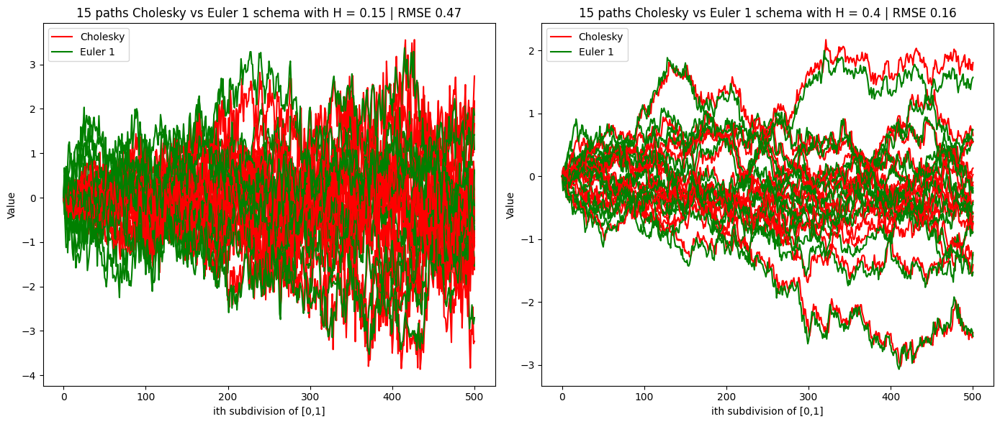

In [8]:
#We fix a seed that will be used for all the Euler and Cholesky in this section to compare it
rng = default_rng(seed)
rng2 = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0] + X0 for H1 in H])
Euler_scheme_1 =  np.array([Euler_1(X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_result (H, T, benchmark,Euler_scheme_1,n_paths,'red', 'green', 'Euler 1')

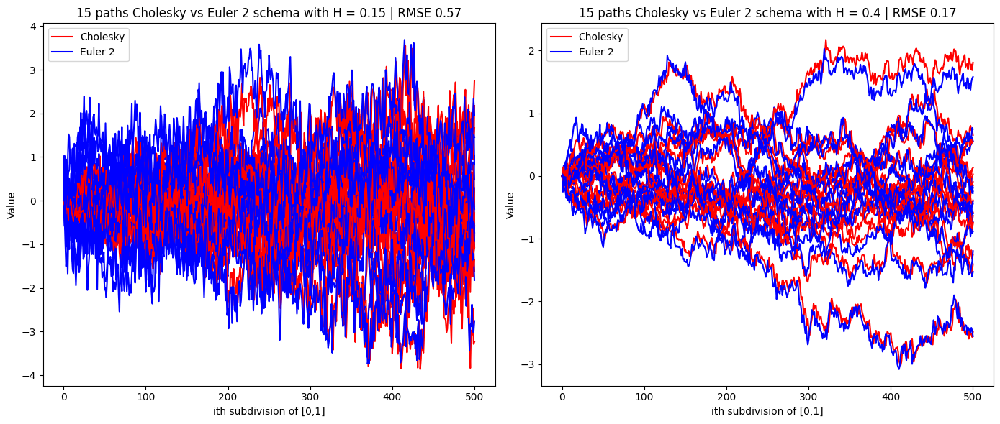

In [9]:
#We make two random generator identitcal to the ones used for Euler scheme 1
rng = default_rng(seed)
rng2 = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_1 =  np.array([Euler_2(X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_result (H, T, benchmark,Euler_scheme_1,n_paths,'red', 'blue', 'Euler 2')

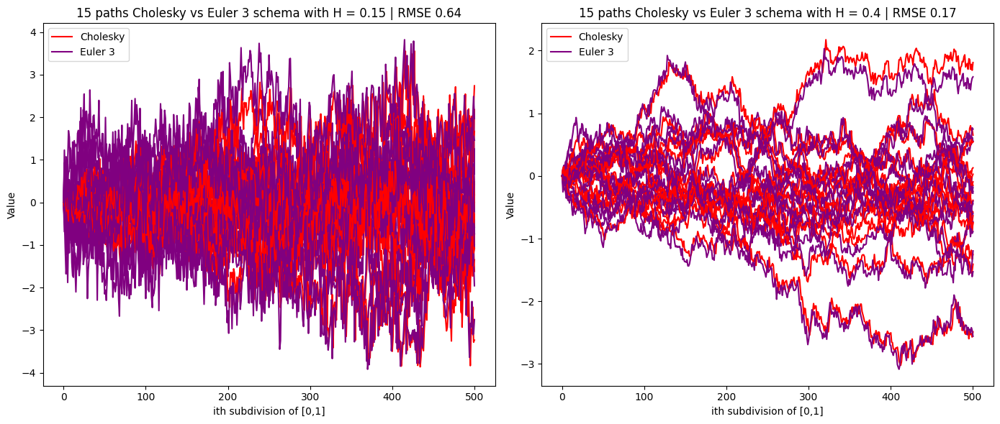

In [10]:
#We make two random generator identitcal to the ones used for Euler scheme 1
rng = default_rng(seed)
rng2 = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_1 =  np.array([Euler_3(X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_result (H, T, benchmark,Euler_scheme_1,n_paths,'red', 'purple', 'Euler 3')

#### Comments: 

We thought to plot our RMSE according to the number of subdivisions and value of H for each schema in order to see which one is the most efficient. 

However, we decided to generate several paths for each Euler schema using the same seed. The RMSE that is given in the title correspond to the average RMSE for each path. 

Therefore, by average effect, we can directly determine which schema is better, and this is the **Euler schema 1**. 

These results can a little differ because of the seed intiated at the beginning. In this case, increase the number of paths and it will lead to the same conclusion. Indeed, our tests with several seed let us to solidify our initial assumption. 

Then we also can deduce that the second Euler schema is better than the third one. 

### Complexity of the Euler schemes:

As all code have to show, we plot the complexity of our algorithms according to the number of subdivisions. 

It is waited to be a linear complexity as coded. 

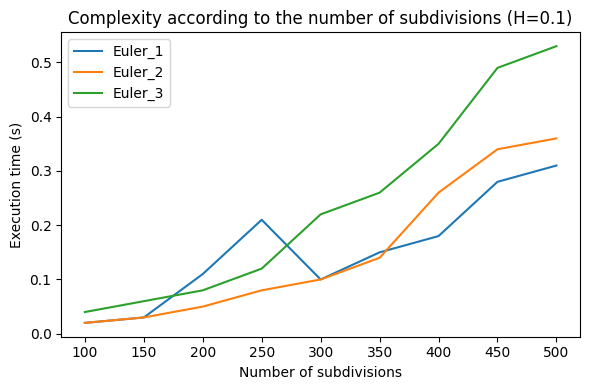

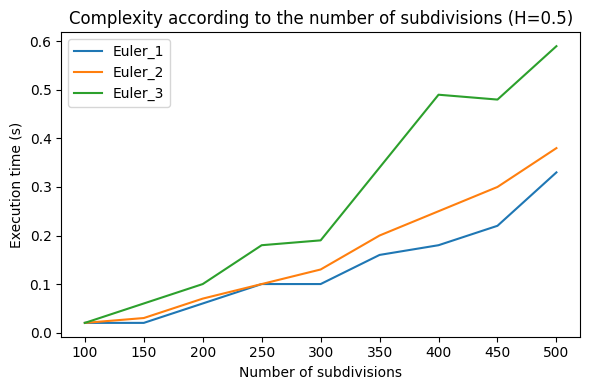

In [11]:
#We plot our complexity according to value of H

X0 = 0
nu = 1
H = 0.1
T = 1
nb_subdivs = np.arange(100, 550, 50) 
n_paths = 1
Euler_schemas = [Euler_1,Euler_2,Euler_3]
titles = ["Euler_1","Euler_2","Euler_3"]
rngs = [default_rng(seed) for i in range (len(Euler_schemas))]

#First plot
plot_complexity(X0, nu, H, nb_subdivs, T, Euler_schemas, titles, rngs)

#Second plot by taking a different H
H=0.5
plot_complexity(X0, nu, H, nb_subdivs, T, Euler_schemas, titles, rngs)

Our complexity is well linear which correspond to what we were looking for. 

Moreover, we can see that the complexity is not linked by the value taken by H. When we take a closer look ton the functions weights, doing computations with the H value, we understand that the complexity is the same for each value of H when H is small, which is the case for $ |H| <1$. 

We are indeed in the presence of a power function using H.

### RMSE by modifying H and our number of subdivisions:

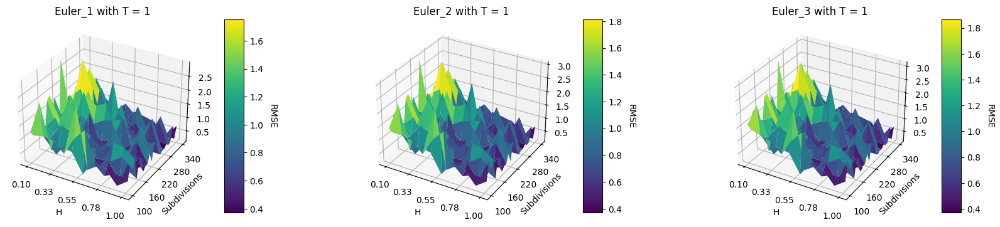

In [12]:
#We plot our RMSE according to the two parameters (careful this cell is long to run)
X0 = 0
nu = 1
H = np.arange(0.1, 1.1, 0.1)
T = 1
nb_subdivs = np.arange(100, 350, 10) 
n_paths = 10
Euler_schemas = [Euler_1,Euler_2,Euler_3]
titles = ["Euler_1","Euler_2","Euler_3"]

#We take the same seed each time to compare from the same generated trajectories 
rngs = [default_rng(seed) for i in range (len(Euler_schemas))]

plot_3D_results_multiple (X0, nu, H, nb_subdivs, T, Euler_schemas,  titles, rngs)

#### Comments

We still take the average on ten paths to compute our RMSE. 

Our RMSE is lower when the function is more regular (H beteween (0.5,1) and when the number of sibdivisions is high. 

The three schemes are close in terme of RMSE. However, a more precise look confirm our affirmation that the **Euler schema 1** is more accurate than the two others. 

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;">3. Multifactor approximations</h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<p  style="background-color: rgb(0, 62, 92); color: white; text-align: center; font-size: 15px;"><strong> Embrace the challenge, and push the boundaries of what's possible by making non-standard multifactor approximations work effectively. </strong></p> 



Based on 
- Abi Jaber, E., & El Euch, O. (2019). Multifactor approximation of rough volatility models. SIAM Journal on Financial Mathematics, 10(2), 309-349. https://arxiv.org/abs/1801.10359
- Abi Jaber, E. (2019). Lifting the Heston model. Quantitative Finance, 19(12), 1995-2013. https://arxiv.org/abs/1810.04868

$$X_{t} = \sim X_{0} + \nu \sum_{k=1}^{n}  c_{k} Y^{k}_{t}$$
with $$  Y^{k}_{t} = \int_{0}^{t} e^{-x_{k}(t-s)}dW_{s}$$
$$  Y^{k}_{t_{i}} = e^{-x_{k} (t_{i}-t_{i-1})} Y^{k}_{t_{i-1}} + \xi_{i}^{k} , \quad \xi_{i}^{k} = \int_{t_{i-1}}^{t_i}e^{-x_{k}(t_{i}-s)}dW_s$$ 
with the parametrization: 

    
$$ c^{n}_{i} = \frac{(r_{n}^{(1-\alpha)}-1) r_{n}^{(\alpha-1)(1+n/2)}}{\Gamma(\alpha)\Gamma(1-\alpha)(1-\alpha)}r_{n}^{(1-\alpha)i},  \quad  x^{n}_{i} = \frac {1-\alpha}{2-\alpha} \frac{r_{n}^{2-\alpha}-1}{r_{n}^{1-\alpha}-1} r_{n}^{i-1-n/2},$$
where $\alpha:=H+1/2$, with a geometric repartition $\eta^{n}_{i}=r_{n}^{i}$ for some $r_{n}$ such that 
$$r_{n} \downarrow 1 \quad \text{and} \quad n \ln r_{n} \to \infty, \quad \text{as } n \to \infty.$$
We denote by 
$$K_{n}(t) = \sum_{i=1}^{n} c_{i} e^{-x_{i} t}$$

The first step is to determine a good value or $r_{n}$ for a choice of $n$, $H$ and $T$.  For this, for a given $H,n,T$,  we can choose $r_{n}$ to minimize
$$ \int_{0}^{T} |K_{n}(t)-K(t)|^2 dt $$

**Question:** Develop the expression (by developing the square) and show that it admits an explicit expression in terms of incomplete gamma function. Write a minimization function to find r and sanity check with the following table ($H=0.1$, $T=0.5$)

<img src="images/tablr.png" alt="Transposition of a vector" title="Vector transposition" width="400">


#### Development formula for Euler factors 1, 2 and 3:

Let's develop the expression we are looking to minimize : 

$\int_0^T |K_n(t) - K(t)|^2 \, dt $

$ = \int_0^T K_n(t)^2 \, dt - 2 \int_0^T K_n(t) K(t) \, dt + \int_0^T K(t)^2 \, dt.$

$ = \int_0^T (\sum_{i=1}^n c_i e^{-x_i t})^{2} \, dt - 2 \int_0^T (\sum_{i=1}^n c_i e^{-x_i t})(\frac{ t^{H-1/2}}{\Gamma(H + 1/2)} \mathbf{1}_{0 \leq t}) \, dt + \int_0^T (\frac{1}{\Gamma(H + 1/2)} t^{H-1/2} \mathbf{1}_{0 \leq t})^2 \, dt.$

= $ \sum_{i=1}^n c_i^2 \int_0^T e^{-2x_i t} \, dt + 2\sum_{j > i} c_i c_j \int_0^T e^{-(x_i + x_j)t} \, dt - 2 \sum_{i=1}^n c_i \int_0^T e^{-x t} \frac{1}{\Gamma(H + 1/2)} t^{H-1/2} \mathbf{1}_{0 \leq t} \, dt +  \frac{1}{\Gamma(H + 1/2)^2} \int_0^T t^{2H-1} \mathbf{1}_{0 \leq t} \, dt.$

= $ \sum_{i=1}^n c_i^2 \frac{1 - e^{-2x_i T}}{2x_i} + 2\sum_{j > i} c_i c_j \frac{1 - e^{-(x_i + x_j)T}}{x_i + x_j} - 2 \sum_{i=1}^n \frac{c_i}{\Gamma(H + 1/2)} \int_0^T e^{-x t} t^{H-1/2} \mathbf{1}_{0 \leq t} \, dt + \frac{T^{2H}}{2H\Gamma(H + 1/2)^2} $ 

= $ \sum_{i=1}^n c_i^2 \frac{1 - e^{-2x_i T}}{2x_i} + 2\sum_{j > i} c_i c_j \frac{1 - e^{-(x_i + x_j)T}}{x_i + x_j} - 2 \sum_{i=1}^n \frac{c_i\gamma\left(H + \frac{1}{2}, x_i T\right)}{\Gamma(H + 1/2)x_i^{H+1/2}}   + \frac{T^{2H}}{2H\Gamma(H + 1/2)^2} $ with $\gamma$ the incomplete gamma function

= $ \underbrace{\sum_{i=1}^n c_i^2 \frac{1 - e^{-2x_i T}}{2x_i}}_{a_1} + \underbrace{2\sum_{j> i} c_i c_j \frac{1 - e^{-(x_i + x_j)T}}{x_i + x_j}}_{a_2} \underbrace{- 2 \sum_{i=1}^n \frac{c_i\gamma\left(H + \frac{1}{2}, x_i T\right)}{\Gamma(H + 1/2)x_i^{H+1/2}}}_{a_3} + \underbrace{\frac{T^{2H}}{2H\Gamma(H + 1/2)^2}}_{a_4} $

We therefore code this function as done in the following : 

In [13]:
def f_to_minimize(r,n,T,H,give_c_x = False) : 

    alpha = H + 1/2

    #Explicit formula for the constants c
    cste_c = ((r**(1-alpha) - 1)*(r**((alpha - 1)*(1 + (n/2))))) / (gamma(alpha)*gamma(1-alpha)*(1-alpha))
    c = cste_c*np.array([r**((1-alpha)*i) for i in range (1,n+1)])

    #Explicit formula for the constants x
    cste_x = ((1-alpha)/(2-alpha))*(((r**(2-alpha)) - 1) / ((r**(1-alpha)) -1))
    x = cste_x*np.array([r**(i - 1 -(n/2)) for i in range (1,n+1)])

    #Derivation of our four terms 
    a1 = np.sum((c**2) * (1 - np.exp(-2 * x * T)) / (2 * x))

    i, j = np.triu_indices(len(c), k=1)
    a2 = (1 - np.exp(-(x[i] + x[j]) * T)) / (x[i] + x[j])
    a1_a2 = 2*np.sum(c[i] * c[j] * a2) + a1
    
    a3 = (-2)*np.sum(c*gammainc(alpha, x*T) / (x**(alpha)))
    a4 = (T**(2*H))/(2*H*(gamma(alpha)**2))

    #Because we will need after having optimized the function to use the optimized constants c and x
    #We let the possibility to only return the constants with the r_optimized in order to not have to minimize again the function
    if give_c_x : 
        return c,x
    else : 
        return  a1_a2 + a3 + a4

Having coded our function, we then just have to code a function to minimize it and to return the optimal r.

In [14]:
#function to comptue the r optimal and to return it 
def r_optimal(n, T, H):
    initial_r = 1.1
    result = minimize(f_to_minimize, initial_r, args=(n, T, H))
    return result.x  

In [15]:
#Sanity check with the provided values to confirm our algorithm works well
H=0.1
T=0.5
n=np.array([4,10,20,40,200])
for n_i in n : 
    r_option = r_optimal(n_i, T, H)
    print("r : ", r_option, "norm2 : ", f_to_minimize(r_option,n_i,T,H))

r :  [50.51486003] norm2 :  0.3699290065419376
r :  [18.04107188] norm2 :  0.11247962792344102
r :  [8.87217956] norm2 :  0.03252416251714707
r :  [4.47244412] norm2 :  0.00756696336838969
r :  [1.69427066] norm2 :  0.00011165658515799315


Now that we know how to determin $r$. 

# Multifactor with Euler methods on factors


We will consider several Euler-type approximations for factors: 
1. **Factor-Euler 1** :
$$ \xi_i^k \approx e^{-x_k dt} \sqrt{dt} Z_i $$
2.  **Factor-Euler 2**: writing $dW_s = Z_i ds / \sqrt{dt}$
$$ \xi_i^k \approx \frac{1}{\sqrt{dt}}   \int_{t_{i-1}}^{t_i}e^{-x_k(t_i-s)}Z_{i}ds = \frac{1}{\sqrt{dt}}  \frac{1-e^{-x_k dt}}{x_k} Z_{i}$$
3. **Factor-Euler 3** : using that $\xi^k_i$ is gaussian with variance $\frac{1 - e^{-2x_k h}}{2x_k} $, so that 
$$\xi_i^k \approx \sqrt{\frac{1 - e^{-2x_k h}}{2x_k}} Z_i$$
4. **Factor-Euler 4** : implicit scheme as in lifting heston paper in the appendix 
5. **Factor-Euler 5** : modified variance: 
$$  X_{t_{i+1}} = X_0 + \nu\sum_{k}  c_k e^{-x_k dt}Y^{k}_{t_i} + \nu \int_{t_i}^{t_{i+1}} K_n({t_{i+1},s}) dW_s$$
approximate second term by variance of original kernel $K$. 


$$ X_t \approx X_0 + \nu \sum_{k=1}^n  c_k Y^{k}_t$$
with $$  Y^k_t = \int_0^t e^{-x_k(t-s)}dW_s$$
$$  Y^k_{t_i} = e^{-x_k (t_{i}-t_{i-1})} Y^{k}_{t_{i-1}} + \xi_i^k , \quad \xi_i^k = \int_{t_{i-1}}^{t_i}e^{-x_k(t_i-s)}dW_s$$ 
with the parametrization: 

#### Centralized functions for the first three schema : 

We will do a centralized function that can accept several khi for the free first Euler schema and will plot them only by changing the khi function. 

We then will code independantly the schema 4 and five. 

All the code will be done before displays and analysis of complexity according to the parameters (H, r, nb_subdiv).

##### Run the following cell. Not necessary to look at it, only plot functions.

In [16]:
def plot_comparing_result_factor_euler(H, approx_factors, T, data1, data2, n_paths, color1, color2, label): 
    num_rows = len(approx_factors)  
    num_cols = len(H) 
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 6 * num_rows)) 
    axes = axes.flatten() 

    for af_idx, approx_factor in enumerate(approx_factors): 
        for h_idx, H_i in enumerate(H):  
            idx = af_idx * num_cols + h_idx  

            for path in range(n_paths):  

                axes[idx].plot(data2[af_idx, h_idx, :, path], color=color2, label=f"{label}" if path == 0 else None)
                axes[idx].plot(data1[h_idx, :, path], color=color1, label="Cholesky" if path == 0 else None)
            
            rmse = np.mean(np.mean((data2[af_idx, h_idx, :, :] - data1[h_idx, :, :])**2, axis=0)**0.5).round(2)

            axes[idx].set_xlabel(f"ith subdivision of [0,{T}]")
            axes[idx].set_ylabel("Value")
            axes[idx].set_title(f"{n_paths} paths Cholesky vs {label} with H ={H_i}, factors={approx_factor} |  RMSE={rmse}")
            axes[idx].legend()

    plt.tight_layout()
    plt.show()

def plot_complexity_factors(X0, nu, H, approx_factors, n_subdivs, T, Euler_schemas, khi,K,titles, rng, with_r_factor = False): 

    if with_r_factor : 
        
        n_cols = len(H)  
        n_rows = len(n_subdivs) 
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows)) 
    
        if n_rows == 1 and n_cols == 1:
            axes = np.array([[axes]])
        elif n_rows == 1:
            axes = np.expand_dims(axes, axis=0)
        elif n_cols == 1:
            axes = np.expand_dims(axes, axis=1)

        for af_idx, n_subdiv in enumerate(n_subdivs):
            times = [[] for _ in Euler_schemas]
            for j in range(len(H)) : 
                for i in range (len(Euler_schemas)): 
                    times[i]=[]
                    for approx_factor in approx_factors : 
    
                        if titles[i] == "Factor Euler 4" : 
                            
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                            
                        elif titles[i] == "Factor Euler 5" : 
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, khi[i], K, approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                        
                        else : 
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, khi[i], approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                        
                ax = axes[af_idx, j]
                for i, time_values in enumerate(times):
                    ax.plot(approx_factors, time_values, label=f"{titles[i]}")
                    ax.set_xticks(approx_factors)
                    ax.set_title(f"Complexity (H={H[j]}, n_subdiv={n_subdiv})")
                    ax.set_xlabel("Number of factors")
                    ax.set_ylabel("Execution time (s)")
                    ax.legend()
    else : 
        n_cols = len(H)  
        n_rows = len(approx_factors) 
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows)) 
    
        if n_rows == 1 and n_cols == 1:
            axes = np.array([[axes]])
        elif n_rows == 1:
            axes = np.expand_dims(axes, axis=0)
        elif n_cols == 1:
            axes = np.expand_dims(axes, axis=1)
        
        for af_idx, approx_factor in enumerate(approx_factors):
            times = [[] for _ in Euler_schemas]
            for j in range(len(H)) : 
                for i in range (len(Euler_schemas)): 
                    times[i]=[]
                    for n_subdiv in n_subdivs : 
    
                        if titles[i] == "Factor Euler 4" : 
                            
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                            
                        elif titles[i] == "Factor Euler 5" : 
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, khi[i], K, approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                        
                        else : 
                            start = time.time()
                            _= Euler_schemas[i](X0, nu, khi[i], approx_factor, n_subdiv, 1, T, H[j], rng[af_idx][j][i])
                            end = time.time()
                            times[i].append(round(end - start, 2))
                        
                ax = axes[af_idx, j]
                for i, time_values in enumerate(times):
                    ax.plot(n_subdivs, time_values, label=f"{titles[i]}")
                    ax.set_xticks(n_subdivs)
                    ax.set_title(f"Complexity (H={H[j]}, factors={approx_factor})")
                    ax.set_xlabel("Number of subdivisions")
                    ax.set_ylabel("Execution time (s)")
                    ax.legend()
    
    plt.tight_layout()
    plt.show()

def plot_3D_results_multiple_factors(X0, nu, H, approx_factor, n_subdiv, T, Euler_schemas, khis,K,titles, rng): 
    
    def compute_RMSE(x, y): 
        return np.mean(np.mean((x - y)**2, axis=0)**0.5).round(7)

    n_schemas = len(Euler_schemas)
    n_cols = 3 
    n_rows = (n_schemas + n_cols - 1) // n_cols 
    
    for row in range(n_rows):
        
        fig, axes = plt.subplots(1, n_cols, subplot_kw={'projection': '3d'}, figsize=(20, 8 * n_rows))
        fig.subplots_adjust(wspace=0.4)  
        axes = axes.flatten() if n_cols > 1 else [axes]
        
        for col in range(n_cols):
            idx = row * n_cols + col

            if idx >=len(Euler_schemas): 
                break
            Euler_schema = Euler_schemas[idx]
            khi = khis[idx]
            title = titles[idx]
            rng = rngs[idx]

            if titles[idx] == "Factor Euler 4" : 
                data = np.array([[compute_RMSE(Euler_schema(X0, nu, approx_factor_i, n_subdiv, 1, T, H_i, rng), simulate_RLfbm_cholesky(H_i, T, n_subdiv, n_paths, nu, rng)[0]+X0 )for H_i in H]for approx_factor_i in approx_factor])   
            elif titles[idx] == "Factor Euler 5" : 
                data = np.array([[compute_RMSE(Euler_schema(X0, nu, khi, K, approx_factor_i, n_subdiv, 1, T, H_i, rng), simulate_RLfbm_cholesky(H_i, T, n_subdiv, n_paths, nu, rng)[0]+X0)for H_i in H]for approx_factor_i in approx_factor])
            else : 
                data = np.array([[compute_RMSE(Euler_schema(X0, nu, khi, approx_factor_i, n_subdiv, 1, T, H_i, rng), simulate_RLfbm_cholesky(H_i, T, n_subdiv, n_paths, nu, rng)[0]+X0 )for H_i in H]for approx_factor_i in approx_factor])
                      
            H_mesh, approx_factor_mesh = np.meshgrid(H, approx_factor)
            surf = axes[col].plot_surface(H_mesh, approx_factor_mesh, data, cmap='viridis')
            cbar = fig.colorbar(surf, ax=axes[col], shrink=0.2, aspect=10, pad=0.1)
            cbar.set_label("RMSE", rotation=270, labelpad=15)

            selected_H_ticks =np.linspace(min(H), max(H), 5) 
            axes[col].set_xticks(selected_H_ticks)
            axes[col].set_xticklabels([f"{tick:.2f}" for tick in selected_H_ticks])
            selected_approx_factor_ticks = np.linspace(min(approx_factor), max(approx_factor), 5)
            axes[col].set_yticks(selected_approx_factor_ticks)
            axes[col].set_yticklabels([f"{int(tick)}" for tick in selected_approx_factor_ticks])

            axes[col].set_title(f"{title} (T = {T}, nb_subdiv = {n_subdiv})")
            axes[col].set_xlabel("H")
            axes[col].set_ylabel("Nb_approx_factors")
            axes[col].set_zlabel("") 

        for col in range(n_cols):
            idx = row * n_cols + col
            if idx >= n_schemas:
                fig.delaxes(axes[col])

        plt.tight_layout()
        plt.show()


## 1. Factor Euler 1,2 and 3

In [17]:
#Function to the first three Euler_schemes, allowed to take the specific khi required. 
def factor_euler_1_2_3(X0, nu, khi, n_approx_factors, n_subdivisions, n_paths, T, H, rng: np.random.Generator = None):
    
    #Possibility to impose the generator to compare same trajectory
    if rng is None:
        rng = np.random.default_rng()

    #We get our r optimal and our corresponding vectors c and x 
    r = r_optimal(n_approx_factors, T, H)
    c, x = f_to_minimize(r, n_approx_factors, T, H, give_c_x=True)

    #We generate our interval lenght, our cumsum of interval lenght and our normal variables
    dt = T / n_subdivisions
    Z = rng.standard_normal(size=(n_subdivisions + 1,n_paths))
    points = np.array([dt*i for i in range(n_subdivisions + 1)])

    #We create X first to optimize the management of the memory
    X = np.empty(n_subdivisions)

    #We compute by implementing the given formula and return the result
    X = np.array([[X0 + (i!=0)*np.sum(np.sum(nu*c[k]*np.exp(x[k]*(points[0:i+1] -points[i]))*khi(x[k],Z[:i+1,p],dt)) for k in range(n_approx_factors)) for p in range(n_paths)] for i in range(n_subdivisions+1)])
    return X


In [18]:
#Different khi functions as given in the exercice
def khi_1 (x,z,dt): 
    return np.exp(-x*dt)*np.sqrt(dt)*z
def khi_2 (x,z,dt): 
    return (1/(np.sqrt(dt)))*(1 - np.exp(-x*dt))*(z/x)
def khi_3 (x,z,dt): 
    return np.sqrt((1-np.exp(-2*x*dt))/(2*x))*z

## 1. Factor Euler 4

### Explanation for Euler_4 : 

$Y_{t}^{k}$ has the dynamic of a Ornstein-Uhlenbeck process with $dY_{t}^{k} = -x_{k}Y_{t}^{k} dt + dW_{t}$.
By discretizing with a lenghts $dt = h$:
$$\hat{Y}_{t_{i}} - \hat{Y}_{t_{i-1}} = -x_{k}\hat{Y}_{t_{i}}^{k} h + (W_{t_{i}} - W_{t_{i-1}})$$
We can rewrite : 
$$\hat{Y}_{t_{i}}^{k} ( 1 + x_{k} h) = \hat{Y}_{t_{i-1}}^{k} + (W_{t_{i}} - W_{t_{i-1}})$$
We pose for the simulation $W_{t_{i}} - W_{t_{i-1}} = \sqrt{h} Z_{i}$.
By multiplying both sides $(1+x_{k}h)^{i-1}$, we obtain by telescopic sum:
$$\hat{Y}_{t_{i}} (1+x_{k}h)^{i} - \hat{Y}_{t_{i-1}} (1+x_{k}h)^{i-1} = (1+x_{k}h)^{i-1} \sqrt{h} Z_{i}$$
ie:
$$\hat{Y}_{t_{i}} = \sum_{j=1}^{i} \frac{\sqrt{h} Z_{j}}{(1+x_{k}h)^{i - j + 1}}$$

The final formula for $\hat{X}_{t_{i}}$ is then:
$$\hat{X}_{t_{i}} = X_{0} + \nu \sum_{k=1}^{n} \sum_{j=1}^{i} \frac{c_{k} \sqrt{h} Z_{j}}{(1+x_{k}h)^{i - j + 1}}$$

In [19]:
def factor_euler_4(X0, nu, n_approx_factors, n_subdivisions, n_paths,T,H, rng: np.random.Generator = None):
    
    #Possibility to impose the generator to compare same trajectory
    if rng is None:
        rng = np.random.default_rng()
        
    #We get our r optimal and our corresponding vectors c and x 
    r = r_optimal(n_approx_factors, T, H)
    c, x = f_to_minimize(r, n_approx_factors, T, H, give_c_x=True)

    #We generate our interval lenght, as well as the index for our partiel sum from 1 to i (by j)
    dt = T / n_subdivisions
    Z = rng.standard_normal(size=(n_subdivisions,n_paths))
    index = np.tril(np.ones((n_subdivisions))) @ np.tril(np.ones((n_subdivisions))) 

    #We compute and return the result
    approx = np.sum(c.reshape(n_approx_factors, 1, 1, 1) * (np.tril(1 / (1 + x[:, np.newaxis, np.newaxis] * T / n_subdivisions) ** index) @ (np.sqrt(T / n_subdivisions) * Z)), axis=0)[0,:,:]
    return np.concatenate([np.zeros((1, n_paths)), nu * approx]) + X0

## 1. Factor Euler 5

In [20]:
def factor_euler_5(X0, nu, khi,K,n_approx_factors, n_subdivisions, n_paths, T, H, rng: np.random.Generator = None):

    #Possibility to impose the generator to compare same trajectory
    if rng is None:
        rng = np.random.default_rng()

    #We get our r optimal and our corresponding vectors c and x 
    r = r_optimal(n_approx_factors, T, H)
    c, x = f_to_minimize(r, n_approx_factors, T, H, give_c_x=True)

    #We generate our interval lenght, our cumsum of interval lenght and our normal variables
    dt = T / n_subdivisions
    Z = rng.standard_normal(size=(n_subdivisions,n_paths))
    points = np.array([dt*i for i in range(n_subdivisions)])

    #We compute the K bespoke to the factor_euler_5
    X = np.empty(n_subdivisions)
    K1 = np.zeros((1, n_paths))
    K2 = np.array([[nu*K(dt, dt, 2*dt, c, x, Z[i-1,p]) for p in range(n_paths) ] for i in range(1,n_subdivisions+1)])
    K = np.concatenate((K1, K2), axis=0)

    #We compute and return the result
    X = np.array([[X0 + K[i+1,p] + (i!=0)*np.sum(np.sum(nu*c[k]*np.exp(x[k]*(points[0:i+1] -points[i]))*khi(x[k],Z[:i+1,p],dt)) for k in range(n_approx_factors)) for p in range(n_paths)] for i in range(n_subdivisions)])
    return np.concatenate([np.zeros((1, n_paths)), X])

In [21]:
#Sepcific sub function for factor_euler_5
def khi_5 (x,z,dt): 
    return np.exp(-2*x*dt)*np.sqrt(dt)*z
def approx_K(dt,t1,t2,c,x,z): 
    return np.sum(np.exp(-x*(t2-t1))*c)*np.sqrt(dt)*z

#### Comments : 

We observed that the choice of the Hurst parameter had a big impact on the efficiency of the Markovian approximation of the Riemann-Liouville fractional Brownian motion.
The models with H close to 0.5 (where the model is actually Markovian for H=1/2) have a dynamic well-explained by a Markovian model with a reasonable amount of factors, while this breaks down when H gets smaller and the dynamic gets more erratic.

In [28]:
#We initiate our first seed
sq = SeedSequence()
seed = sq.entropy 

#We initiate our parameters
X0 = 0
nu = 1
H = [0.15,0.4]
T = 1
nb_subdiv = 500
n_paths = 10
approx_factors = [5,40,100]

#### The indicated RMSE corresponds to the average RMSE for all the paths generated in the specific graph. 

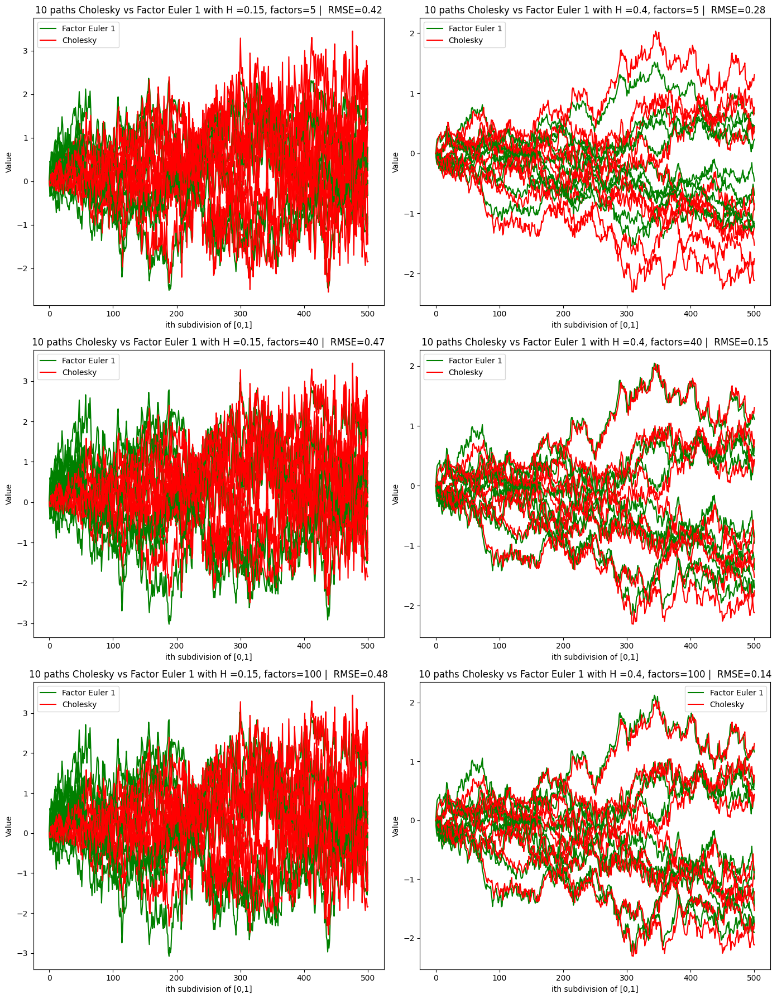

In [29]:
#Because the cholesky schema does not depend of the r_factors, it is important we launch Euler schemes with the same seed
rngs=[default_rng(seed) for i in range (len(approx_factors))]
rng = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0] +X0 for H1 in H])
Euler_scheme_1 =  np.array([[factor_euler_1_2_3(X0, nu, khi_1,approx_factor_i, nb_subdiv, n_paths, T, H1, rng_i)for H1 in H] for (rng_i,approx_factor_i) in zip(rngs,approx_factors)])
plot_comparing_result_factor_euler (H,approx_factors, T,benchmark,Euler_scheme_1,n_paths,'red', 'green', 'Factor Euler 1')

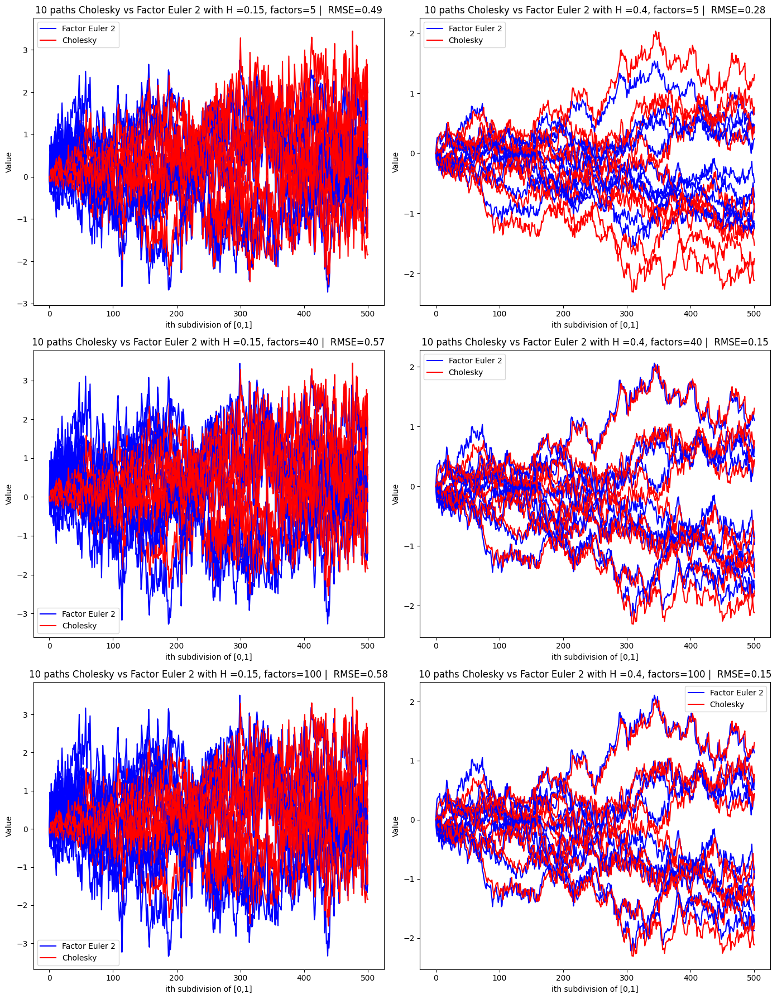

In [30]:
#Because the cholesky schema does not depend of the r_factors, it is important we launch Euler schemes with the same seed
rngs=[default_rng(seed) for i in range (len(approx_factors))]
rng = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_2 =  np.array([[factor_euler_1_2_3(X0, nu, khi_2,approx_factor_i, nb_subdiv, n_paths, T, H1, rng_i)for H1 in H] for (rng_i,approx_factor_i) in zip(rngs,approx_factors)])
plot_comparing_result_factor_euler (H,approx_factors, T,benchmark,Euler_scheme_2,n_paths,'red', 'blue', 'Factor Euler 2')

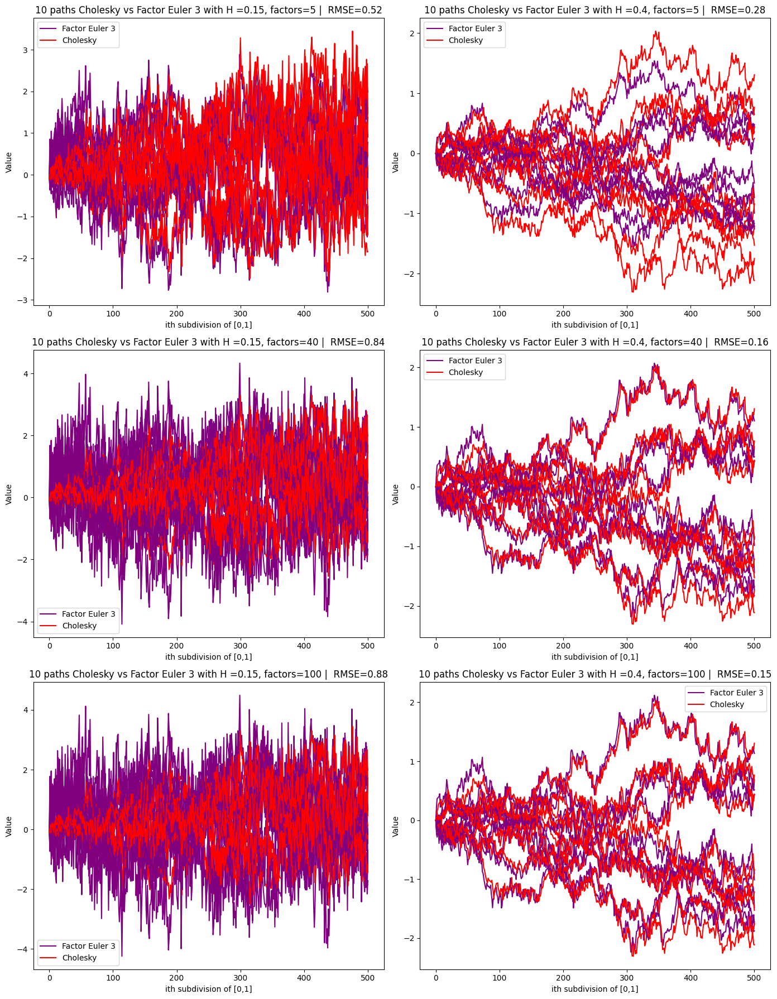

In [31]:
#Because the cholesky schema does not depend of the r_factors, it is important we launch Euler schemes with the same seed
rngs=[default_rng(seed) for i in range (len(approx_factors))]
rng = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_3 =  np.array([[factor_euler_1_2_3(X0, nu, khi_3,approx_factor_i, nb_subdiv, n_paths, T, H1, rng_i)for H1 in H] for (rng_i,approx_factor_i) in zip(rngs,approx_factors)])
plot_comparing_result_factor_euler (H,approx_factors, T,benchmark,Euler_scheme_3,n_paths,'red', 'purple', 'Factor Euler 3')

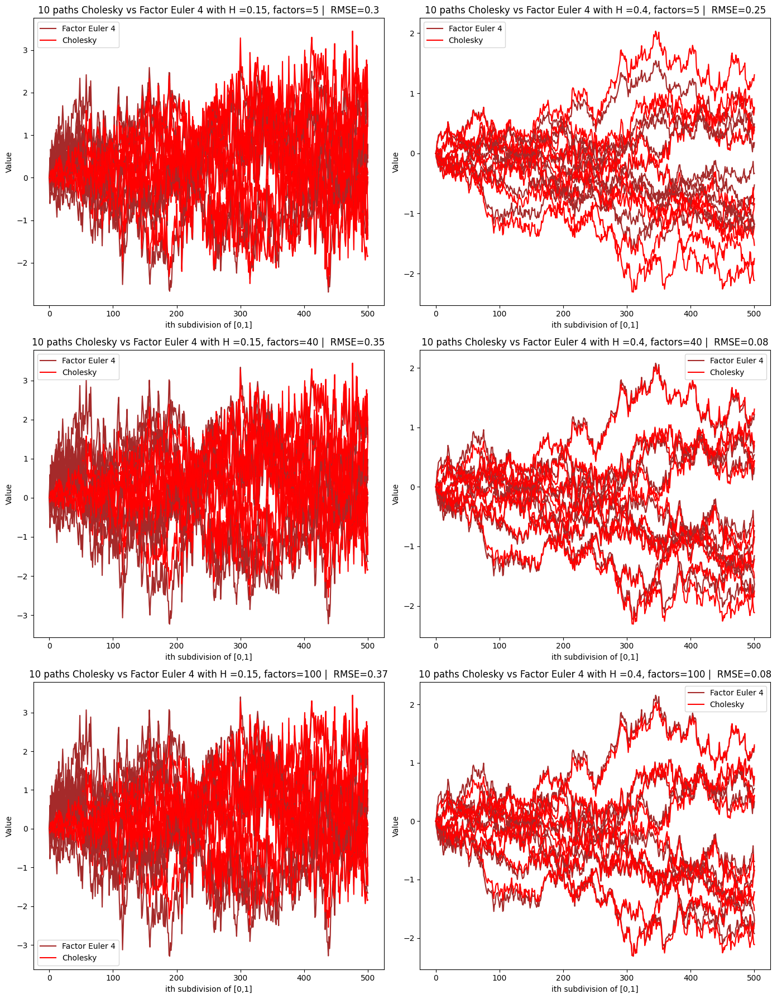

In [32]:
#Because the cholesky schema does not depend of the r_factors, it is important we launch Euler schemes with the same seed
rngs=[default_rng(seed) for i in range (len(approx_factors))]
rng = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_4 =  np.array([[factor_euler_4(X0, nu, approx_factor_i, nb_subdiv, n_paths,T,H1,rng_i)for H1 in H] for (rng_i,approx_factor_i) in zip(rngs,approx_factors)])
plot_comparing_result_factor_euler (H,approx_factors, T,benchmark,Euler_scheme_4,n_paths,'red', 'brown', 'Factor Euler 4')

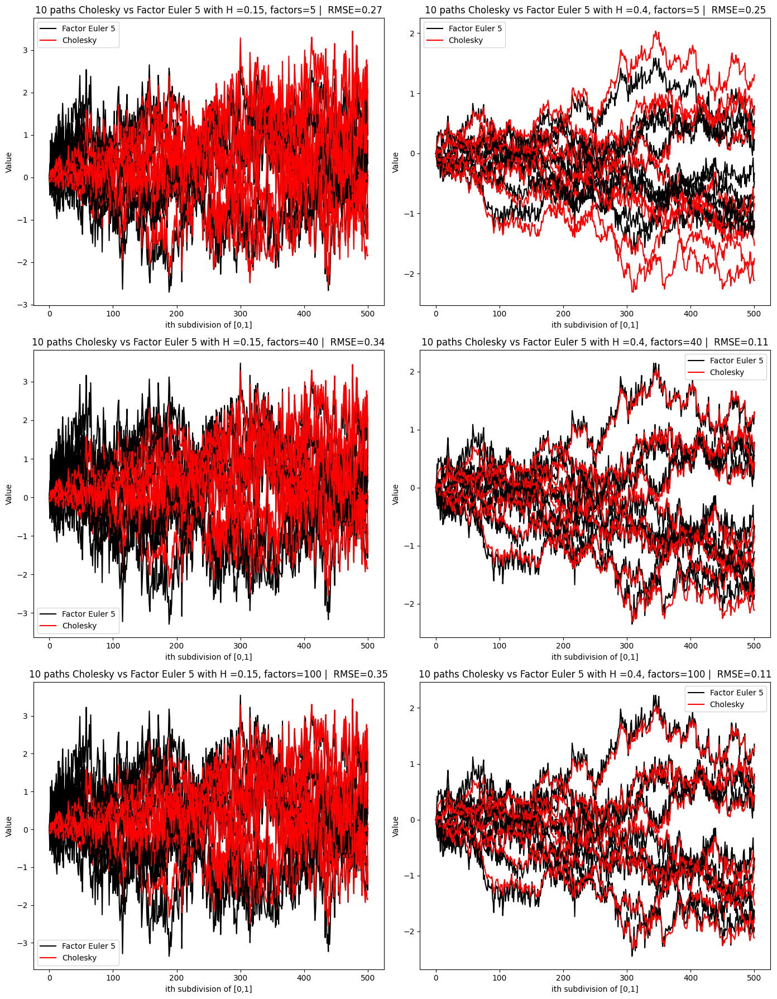

In [33]:
#Because the cholesky schema does not depend of the r_factors, it is important we launch Euler schemes with the same seed
rngs=[default_rng(seed) for i in range (len(approx_factors))]
rng = default_rng(seed)

benchmark = np.array([simulate_RLfbm_cholesky(H1, T, nb_subdiv, n_paths, nu, rng)[0]+X0 for H1 in H])
Euler_scheme_5 =  np.array([[factor_euler_5(X0, nu, khi_5,approx_K,approx_factor_i, nb_subdiv, n_paths, T, H1, rng_i) for H1 in H] for (rng_i,approx_factor_i) in zip(rngs,approx_factors)])
plot_comparing_result_factor_euler (H,approx_factors, T,benchmark,Euler_scheme_5,n_paths,'red', 'black', 'Factor Euler 5')

#### Comments: 

We thought to plot our RMSE according to the number of subdivisions and value of H for each schema in order to see which one is the most efficient. 

However, we decided to generate several paths for each Factor Euler schema using the same seed. The RMSE that is given in the title correspond to the average RMSE for each path. 

Therefore, by average effect, we can directly determine which schema is better, and this is the **Factor Euler schema 4**. 

These results can a little differ because of the seed intiated at the beginning. In this case, increase the number of paths and it will lead to the same conclusion. Indeed, our tests with several seed let us to solidify our initial assumption. 

### Complexity of the Euler schemes: 

We are interested to investigate the complexity of our schemes. We are waiting for a linear complexity in the number of simulations as well as in the number of approx factors. The value of H should have no incidence (equivalent in term of complexity or sublinear)

This is one of the drawbacks of the Markovian approach is that unless we are looking to generate a path with a large number of subdivisions, the complexity cost from requiring 50, 100+ factors to get a good fit of the paths does not provide faster code than the direct simulations.

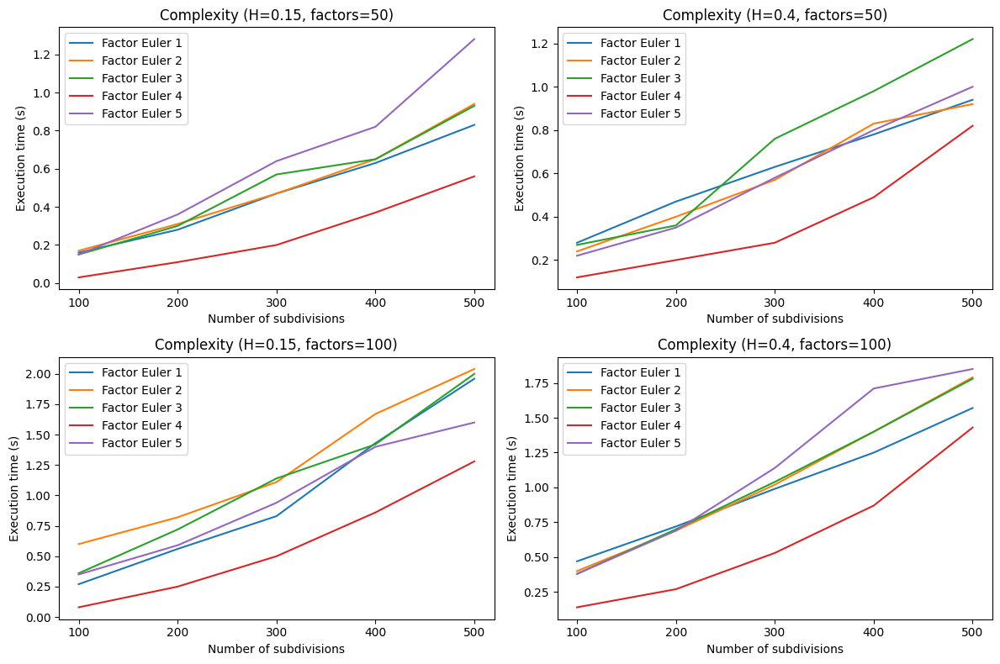

In [34]:
#We plot our complexity for the number of subdivisions according to value of H and the number of factors used
X0 = 0
nu = 1
H = [0.15,0.4]
T = 1
nb_subdivs = np.arange(100, 600, 100) 
n_paths = 1
approx_factors = [50,100]

Euler_schemas = [factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_4,factor_euler_5]
titles = ["Factor Euler 1","Factor Euler 2","Factor Euler 3","Factor Euler 4","Factor Euler 5"]
khi=[khi_1,khi_2,khi_3,"",khi_5]
rngs=[[[default_rng(seed)for j in range (len(Euler_schemas))] for p in range (len(H))]for i in range (len(approx_factors))]

plot_complexity_factors(X0, nu, H, approx_factors,nb_subdivs, T, Euler_schemas, khi,approx_K,titles, rngs)

#### Comments: 

As expected, we can see the linear complexity according to the number of subdivision, without any impact from the choice of H.  However, we also see a significant shift on the y values axis with increasing the n approx factors. 

On top of being the most accurate one, the Factor Euler 4 is also the fastest.

Let's plot it to confirm the linear complexity. 

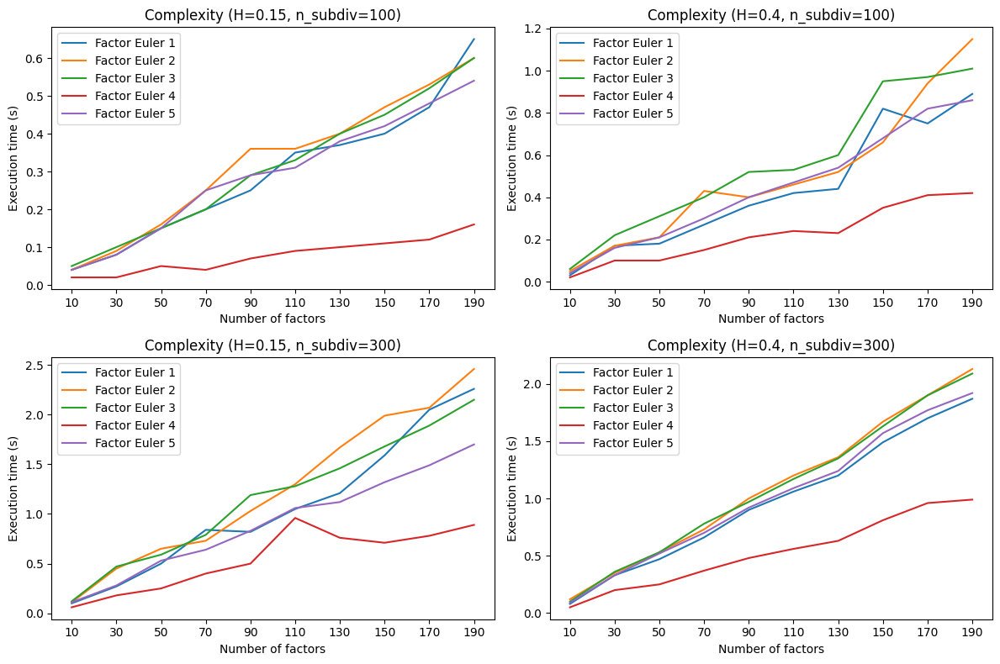

In [35]:
#We plot our complexity for the number of factors according to value of H and the number of subdivisions
X0 = 0
nu = 1
H = [0.15,0.4]
T = 1
nb_subdivs = [100,300] 
n_paths = 1
approx_factors = np.arange(10, 200, 20)

Euler_schemas = [factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_4,factor_euler_5]
titles = ["Factor Euler 1","Factor Euler 2","Factor Euler 3","Factor Euler 4","Factor Euler 5"]
khi=[khi_1,khi_2,khi_3,"",khi_5]
rngs=[[[default_rng(seed)for j in range (len(Euler_schemas))] for p in range (len(H))]for i in range (len(nb_subdivs))]

plot_complexity_factors(X0, nu, H, approx_factors,nb_subdivs, T, Euler_schemas, khi,approx_K,titles, rngs,with_r_factor=True)

#### Comments: 

We find a linear complexity with the number of factors used, with no incidence of the H value. We have a shift by increasing the number of subdivision, revealing the associated linear complexity highlighted above.

The total complexity of algorithm is therefore **nb_subdiv * nb_approx_factors** or in other word $O(n^2)$. 

The Factor Euler 4 is therefore the fastest both in terme of nb_subdiv and nb_factors.

Let's plot it to see by ourselves the linear complexity. 

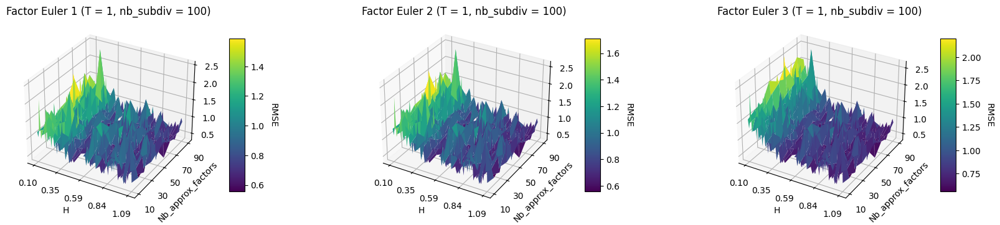

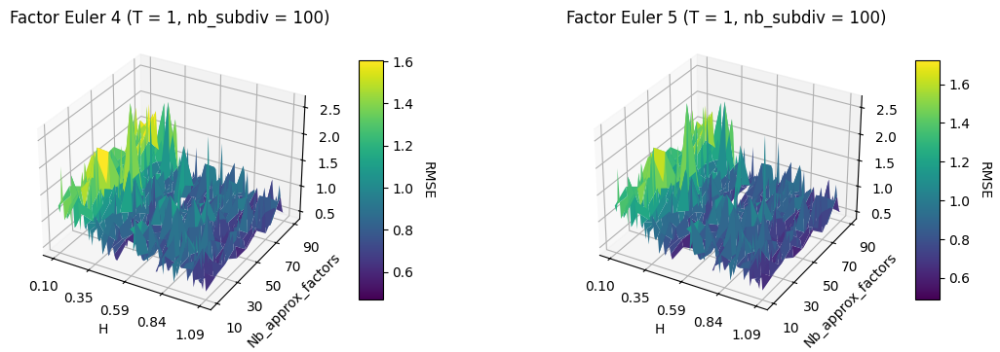

In [36]:
#We plot our complexity according to value of H (careful this cell is long to run)
#We initiate our parameters
rng = default_rng(seed)

X0 = 0
nu = 1
H = np.arange(0.1,1.1 , 0.01)
H = H[H != 0.5] #We have a computational problem when H = 0.5 because the Gamma function is not defined in H (Gamma(1-(0.5+H))
T = 1
nb_subdivs = 100
n_paths = 10
approx_factors = np.arange(10, 100, 10)

Euler_schemas = [factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_1_2_3,factor_euler_4,factor_euler_5]
titles = ["Factor Euler 1","Factor Euler 2","Factor Euler 3","Factor Euler 4","Factor Euler 5"]
khi=[khi_1,khi_2,khi_3,"",khi_5]
rngs=rngs=[default_rng(seed) for i in range (len(Euler_schemas))]

plot_3D_results_multiple_factors(X0, nu, H, approx_factors, nb_subdivs, T, Euler_schemas, khi,approx_K,titles, rng)

#### Comments : 

We still take the average on ten paths to compute our RMSE. 

As expected, we see that increasing the number of approx factors has a clear positive effect on our RMSE. However, this effect tends to be less true when H is small and therefore our path very fractionnal. 

These 3D plots can be considered as a good proxy for the quality of our plots as this is the averaged RMSE over 10 paths generated each time for each combinaison of our parameters. 

To conclude, it is a good idea to improve the number of approx factor the more the trajectory we are trying to simulate is smooth. If it is too fractionnal, it may seems better to reduce the number of approx factors. 

However, we saw during our simulations that there is a small Relationship between the number of subdivisions and the number of approx_factors. If the number of approx_factors is too big (like more than 60%) compared to the number of subdivision, it can sometimes increase the RMSE. Therefore, a good approach to well stick to a very fractionnal trajectory would be to try with a large number of subdivisions and a large number of approx factors, and try then less approx factors with the same subdivisions in order to get a clear idea about this relationship.

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<a id="fbm"></a><h1 style="text-align:center;">4. Going beyond</h1>

<div style="background-color: rgb(0, 62, 92); height:10px; margin-top:25px; margin-bottom:25px;"></div>

<p  style="background-color: rgb(0, 62, 92); color: white; text-align: center; font-size: 15px;"><strong> Simulation is not a one-size-fits-all solution. Break free from the mold and discover new methods to solve the problem at hand. </strong></p> 


Explain how the above method can be adapted to the shifted kernel  
$$ K_{\epsilon}(t,s) = \frac{1}{\Gamma(H + 1/2)} (\epsilon + t - s)^{H-1/2} 1_{s<t}$$

Notice that now $H\in (-\infty, \infty)$. Why?

Study the impact of $\epsilon>0$ on the schemes. You can make epsilon vary between  $0$ and $1/52$, also for $\epsilon>0$ you can test with $H$ varying between $-1$ and $0.5$ 

$\textbf{Answer to why H can now take any value:}$

For $\epsilon > 0$, the kernel admits now a finite limit as $s \to t$ for any $H \in (-\infty, \infty)$ as $t-s + \epsilon \geq \epsilon$.
As such, the integral $\int_{0}^{t} (\epsilon + t-s)^{H-\frac{1}{2}}ds$ is now finite for any value of H.

### Commentez et répondre à la question going beyond

##### Run the following cell. Not necessary to look at it, only plot functions.

In [31]:
def plot_comparing_epsilon(H, T, data1,data2,n_paths,color1, color2, eps): 
    
    num_graphs = len(data1) 
    num_rows = (num_graphs + 1) // 2    
    fig, axes = plt.subplots(num_rows, 2, figsize=(14, 6 * num_rows))
    axes = axes.flatten()  

    for i in range(len(data1)): 

        for path in range(n_paths):
            axes[i].plot(data1[i][:, path], color=color1, label="Cholesky" if path == 0 else None)
            axes[i].plot(data2[i][:, path], color=color2, label="Euler 1" if path == 0 else None)
        
        axes[i].set_xlabel(f"ith subdivision of [0,{T}]")
        axes[i].set_ylabel("Value")
        axes[i].set_title(f"{n_paths} paths Cholesky vs Euler scheme 1 with H = {H[i]}, $\epsilon$ = {eps} | RMSE {np.mean(np.mean((data1[i] - data2[i])**2, axis=0)**0.5).round(2)}")
        axes[i].legend()
        
    for j in range(num_graphs, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

## 1. Shifted Euler

In [ ]:
#We introduce the epsilon within our kernel
#Final parameter being less than 1 matches that the kernel is zero for s > t.
def shifted_kernel_covariance(epsilon, H, t, s, v):
    a = H + 1/2
    normalizing = (gamma(a) * gamma(1 + a))
    result = v**2 * ((s**a)/(t+epsilon)**(1-a)) * sc.hyp2f1(1, 1 - a, 1 + a, s/(t+epsilon)) / normalizing
    return result


#To compare the same things, we also shift our Cholesky function
def shifted_cholesky(H, T, n_steps, n_paths, epsilon, normalising_constant = 1, rng: np.random.Generator = None):

    #Possibility to impose the generator to compare same trajectory
    if rng is None : 
        rng = np.random.default_rng()

    #We compute our lenght of discretisation
    dt = T/n_steps
    t_vec = np.linspace(dt, T, n_steps)

    #We apply the Cholesky method
    cov_matrix = [[(shifted_kernel_covariance(epsilon, H, t, s, normalising_constant) if s <= t else shifted_kernel_covariance(epsilon, H,s,t, normalising_constant)) for t in t_vec] for s in t_vec]
    L = np.linalg.cholesky(cov_matrix)
    norm_vec = rng.standard_normal((n_steps,n_paths))
    fbm_path = L@norm_vec
    return  np.concatenate([np.zeros((1, n_paths)), fbm_path]), np.concatenate([np.zeros((1,)),t_vec])

In [33]:
#Definition of the weight function associated with the first euler schema with the shift
#We extracted this function from the first expression in this challenge of K(s,t) after shifting by epsilon
def weights_euler_1_shifted(epsilon, i,j,dt,H) : 
    if j > i or i==0 or j==0:
        return 0
    else: 
        return (1/gamma(H + 0.5))*((epsilon + dt*(i-j+1))**(H - 0.5))

#First Euler schema
def shifted_Euler_1(epsilon, X0, nu, H, n_subdiv, n_paths, T,rng: np.random.Generator = None): 

    #Possibility to impose the generator to compare same trajectory
    if rng is None :
        rng = np.random.default_rng() 

    #This is a shortcut : we should do a vector of the difference in case the discretisation is not uniformly done 
    dt = T / n_subdiv

    #We compute the sum for each discretized point of our schema
    weights = np.array([[weights_euler_1_shifted(epsilon, i,j,dt,H) for j in range (n_subdiv+1)] for i in range(n_subdiv+1)])

    #We then generate our random gaussian reduced centered variables
    Z = rng.standard_normal(size=(n_subdiv+1,n_paths))

    #We close with the final formula
    X = weights @ Z
    return (X0 + nu*(np.sqrt(dt)*X))


$\textbf{Observations:}$

We are comparing for a fixed number of subdivisions how the shifted kernel process gets approximated by the Euler scheme 1.
As $\epsilon$ increases away from 0, the kernel becomes smoother for exponents different from $\frac{1}{2}$.

For $H = 0.15$, we observe that the RMSE of fit drops as $\epsilon$ ranges in $[0, 0.01, 0.02]$.

For $H = 0.4$ which is closer to $\frac{1}{2}$, the RMSE of fit also drops but much more slowly as the kernel was already closer to being smooth.

In [34]:
#Initialize the parameters for the simulation
X0 = 0
nu = 1
H = [0.15,0.4]
T = 1
nb_subdiv = 500
n_paths = 10

#We generate a seed and we make two random generator identitcal (same initiation and randomness algorithm then) to compare same paths
sq = SeedSequence()
seed = sq.entropy 

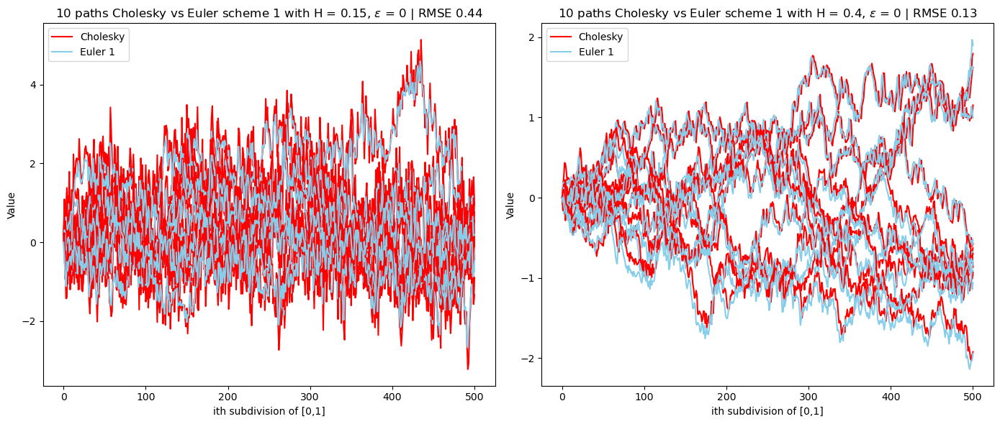

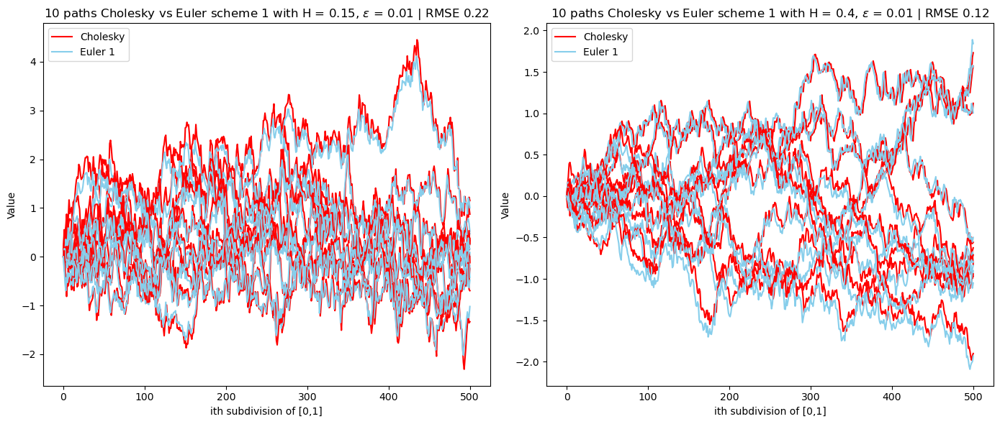

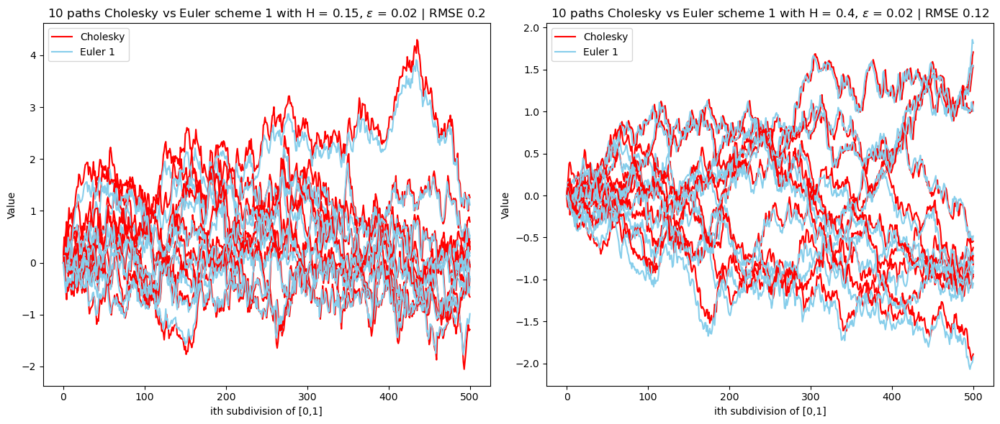

In [35]:
#For each time we generate, we keep the same seed for comparaison purposes
rng = default_rng(seed)
rng2 = default_rng(seed)
epsilon = 0
shifted_benchmark = np.array([shifted_cholesky(H1, T, nb_subdiv, n_paths, epsilon, nu, rng)[0] for H1 in H])
shifted_Euler_scheme_1 =  np.array([shifted_Euler_1(epsilon, X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_epsilon(H, T, shifted_benchmark,shifted_Euler_scheme_1,n_paths,'red', 'skyblue', epsilon)

rng = default_rng(seed)
rng2 = default_rng(seed)
epsilon = epsilon = 0.01
shifted_benchmark = np.array([shifted_cholesky(H1, T, nb_subdiv, n_paths, epsilon, nu, rng)[0] for H1 in H])
shifted_Euler_scheme_1 =  np.array([shifted_Euler_1(epsilon, X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_epsilon(H, T, shifted_benchmark,shifted_Euler_scheme_1,n_paths,'red', 'skyblue', epsilon)

rng = default_rng(seed)
rng2 = default_rng(seed)
epsilon = epsilon = 0.02
shifted_benchmark = np.array([shifted_cholesky(H1, T, nb_subdiv, n_paths, epsilon, nu, rng)[0] for H1 in H])
shifted_Euler_scheme_1 =  np.array([shifted_Euler_1(epsilon, X0, nu, H1, nb_subdiv, n_paths, T,rng2)for H1 in H])
plot_comparing_epsilon(H, T, shifted_benchmark,shifted_Euler_scheme_1,n_paths,'red', 'skyblue', epsilon)

#### Comments:

We will now plot the exact Cholesky simulation for varying $\epsilon$ to see how for a fixed path of $W$, $\epsilon$ changes the path of the resulting kernel process.

We observe that the original drift of $\epsilon$ away from 0 changes drastically the dynamic, and the sensitivity with respect to $\epsilon$ flattens out away from 0.


In [36]:
#We still stay with the same seed
rngs = [default_rng(seed) for i in range(3)] #Setting seeds to compare cholesky with different epsilon on a same trajectory.
shifted_benchmarks = {}
epsilon_values = [0,0.01,0.02]

for i in range(3):
    shifted_benchmarks[i] = [shifted_cholesky(0.15, T, nb_subdiv, n_paths, epsilon_values[i], nu, rngs[i])[0], shifted_cholesky(0.4, T, nb_subdiv, n_paths, epsilon_values[i], nu, rngs[i])[0]]
    
RMSE = pd.DataFrame(np.array([[np.mean(np.mean((shifted_benchmarks[i][0] - shifted_benchmarks[j][0])**2, axis=0)**0.5) for i in range(3)] for j in range(3)]), index=epsilon_values, columns=epsilon_values)
RMSE1 = pd.DataFrame(np.array([[np.mean(np.mean((shifted_benchmarks[i][1] - shifted_benchmarks[j][1])**2, axis=0)**0.5) for i in range(3)] for j in range(3)]), index=epsilon_values, columns=epsilon_values)

          0.00      0.01      0.02
0.00  0.000000  0.377107  0.431619
0.01  0.377107  0.000000  0.072165
0.02  0.431619  0.072165  0.000000


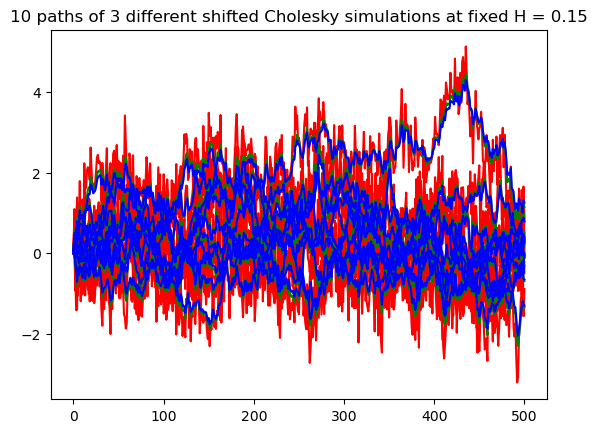

In [37]:
colors = ['red', 'green', 'blue']
for i in range(3):
    plt.plot(shifted_benchmarks[i][0], color=colors[i], label=f"Epsilon = {epsilon_values[i]}")
plt.title(f"{n_paths} paths of {len(epsilon_values)} different shifted Cholesky simulations at fixed H = 0.15")
print(RMSE)
plt.show()

          0.00      0.01      0.02
0.00  0.000000  0.377107  0.431619
0.01  0.377107  0.000000  0.072165
0.02  0.431619  0.072165  0.000000


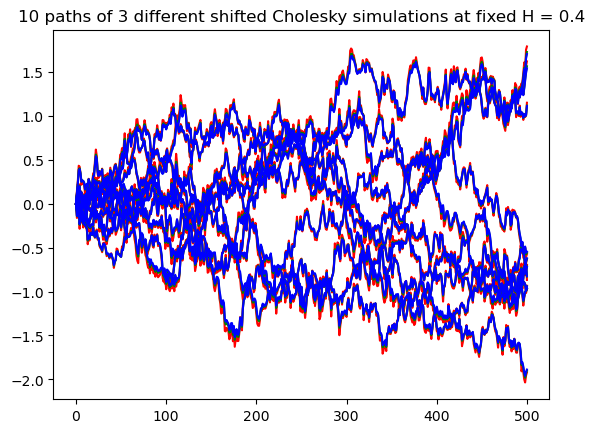

In [38]:
colors = ['red', 'green', 'blue']
for i in range(3):
    plt.plot(shifted_benchmarks[i][1], color=colors[i], label=f"Epsilon = {epsilon_values[i]}")
plt.title(f"{n_paths} paths of {len(epsilon_values)} different shifted Cholesky simulations at fixed H = 0.4")
print(RMSE)
plt.show()

$\textbf{Hurst exponents going beyond 0:}$

We will conclude by exploring the dynamics of the process when we allow now $H$ to be smaller than $0$ for $\epsilon > 0$ now that the kernel is no longer rough.

As before, we observe that for $\epsilon$ close to zero (that we can no longer take equal to zero for those exponents), the kernel is close to being rough and the sensitivity to $\epsilon$ is much more important as $H$ grows in the negative values.

The RMSE starts exploding much faster with $H = -0.4$ than with $H = -0.2$.

The small table printed above each plot corresponds to the RMSE between the paths with $\epsilon, \epsilon'$ as parameters on the block $(\epsilon, \epsilon')$

In [39]:
rngs = [default_rng(seed) for i in range(3)]
shifted_benchmarks = {}
epsilon_values = [0.01,0.02,0.03]

for i in range(len(epsilon_values)):
    shifted_benchmarks[i] = [shifted_cholesky(-0.2, T, nb_subdiv, n_paths, epsilon_values[i], nu, rngs[i])[0], shifted_cholesky(-0.45, T, nb_subdiv, n_paths, epsilon_values[i], nu, rngs[i])[0]]
    
RMSE = pd.DataFrame(np.array([[np.mean(np.mean((shifted_benchmarks[i][0] - shifted_benchmarks[j][0])**2, axis=0)**0.5) for i in range(len(epsilon_values))] for j in range(len(epsilon_values))]), index=epsilon_values, columns=epsilon_values)
RMSE1 = pd.DataFrame(np.array([[np.mean(np.mean((shifted_benchmarks[i][1] - shifted_benchmarks[j][1])**2, axis=0)**0.5) for i in range(3)] for j in range(3)]), index=epsilon_values, columns=epsilon_values)

          0.01      0.02      0.03
0.01  0.000000  0.389988  0.591714
0.02  0.389988  0.000000  0.205508
0.03  0.591714  0.205508  0.000000


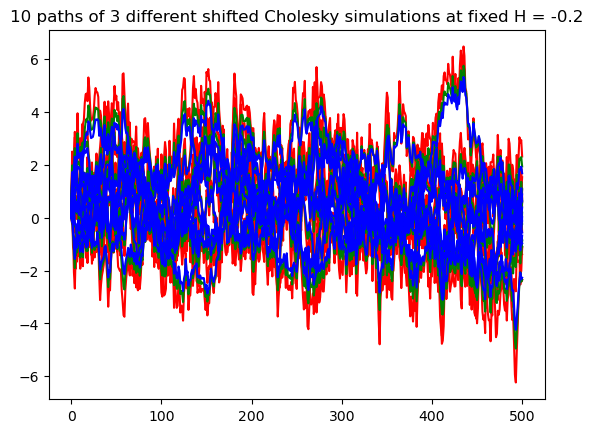

In [40]:
colors = ['red', 'green', 'blue']
for i in range(len(epsilon_values)):
    plt.plot(shifted_benchmarks[i][0], color=colors[i], label=f"Epsilon = {epsilon_values[i]}")
plt.title(f"{n_paths} paths of {len(epsilon_values)} different shifted Cholesky simulations at fixed H = -0.2")
print(RMSE)
plt.show()

          0.01      0.02      0.03
0.01  0.000000  0.597912  0.866530
0.02  0.597912  0.000000  0.274621
0.03  0.866530  0.274621  0.000000


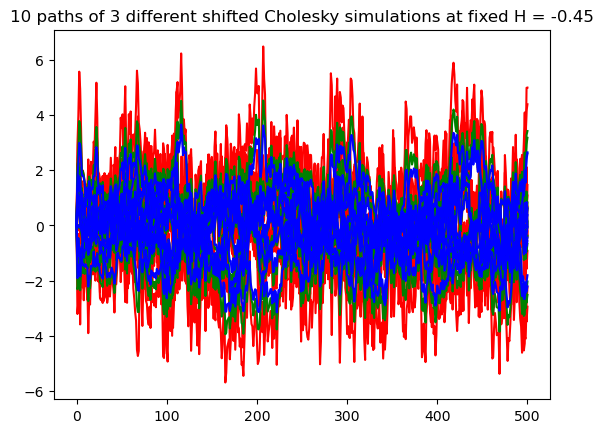

In [41]:
colors = ['red', 'green', 'blue']
for i in range(len(epsilon_values)):
    plt.plot(shifted_benchmarks[i][1], color=colors[i], label=f"Epsilon = {epsilon_values[i]}")
plt.title(f"{n_paths} paths of {len(epsilon_values)} different shifted Cholesky simulations at fixed H = -0.45")
print(RMSE1)
plt.show()